# Stable Diffusion for Inference

Following https://huggingface.co/docs/diffusers/v0.13.0/en/stable_diffusion

In [1]:
model_id = "runwayml/stable-diffusion-v1-5"

In [2]:
from diffusers import StableDiffusionPipeline

pipe = StableDiffusionPipeline.from_pretrained(model_id)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [3]:
prompt = "cartoon image of the idiomatic expression 'when pigs fly'"

In [4]:
# if you're running on a gpu machine, uncomment this block
# pipe = pipe.to("cuda") 

In [5]:
import torch

generator = torch.Generator().manual_seed(0)

  0%|          | 0/50 [00:00<?, ?it/s]

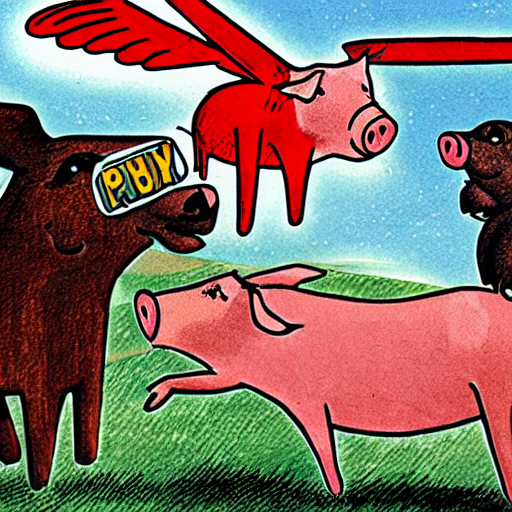

In [6]:
image = pipe(prompt, generator=generator).images[0]
image

The above command took about 2 minutes on my local non-gpu machine. 

The default run we did above used full float32 precision and ran the default number of inference steps (50). The easiest speed-ups come from switching to float16 (or half) precision and simply running fewer inference steps. Let’s load the model now in float16 instead.


## Speed Optimization

In [7]:
import torch

pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
# pipe = pipe.to("cuda")   

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [8]:
generator = torch.Generator().manual_seed(0)

image = pipe(prompt, generator=generator).images[0]
image


RuntimeError: "LayerNormKernelImpl" not implemented for 'Half'

Ah, looks like this precicison is only supported on GPU, not on CPU. See more here: https://github.com/pytorch/pytorch/issues/52291.

In [11]:
pipe = StableDiffusionPipeline.from_pretrained(model_id)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

There are other schedulers that may converge in fewer iterations than the default. Let's check them out

In [12]:
pipe.scheduler.compatibles

[diffusers.schedulers.scheduling_deis_multistep.DEISMultistepScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_ancestral_discrete.KDPM2AncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_euler_discrete.EulerDiscreteScheduler,
 diffusers.schedulers.scheduling_ddim.DDIMScheduler,
 diffusers.schedulers.scheduling_k_dpm_2_discrete.KDPM2DiscreteScheduler,
 diffusers.utils.dummy_torch_and_torchsde_objects.DPMSolverSDEScheduler,
 diffusers.schedulers.scheduling_heun_discrete.HeunDiscreteScheduler,
 diffusers.schedulers.scheduling_ddpm.DDPMScheduler,
 diffusers.schedulers.scheduling_euler_ancestral_discrete.EulerAncestralDiscreteScheduler,
 diffusers.schedulers.scheduling_dpmsolver_multistep.DPMSolverMultistepScheduler,
 diffusers.utils.dummy_torch_and_scipy_objects.LMSDiscreteScheduler,
 diffusers.schedulers.scheduling_edm_euler.EDMEulerScheduler,
 diffusers.schedulers.scheduling_dpmsolver_singlestep.DPMSolverSinglestepScheduler,
 diffusers.schedulers.scheduling_unipc_multistep.Uni

In [13]:
from diffusers import DPMSolverMultistepScheduler

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)


  0%|          | 0/20 [00:00<?, ?it/s]

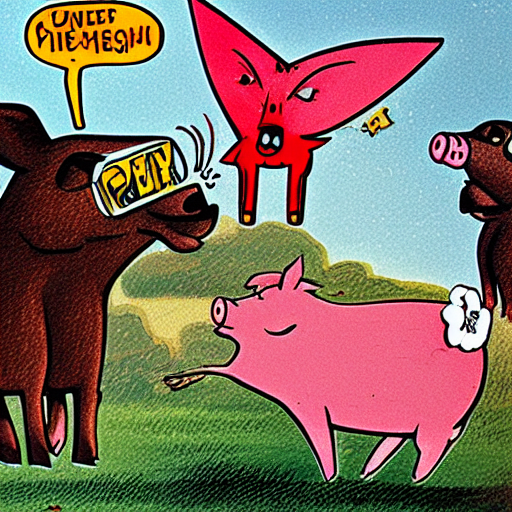

In [14]:
generator = torch.Generator().manual_seed(0)

image = pipe(prompt, generator=generator, num_inference_steps=20).images[0]

image

## Memory Optimization

In [18]:
# Let's run inference in batches

def get_inputs(batch_size=1):
    generator = [torch.Generator().manual_seed(i) for i in range(batch_size)]
    prompts = batch_size * [prompt]
    num_inference_steps = 20

    return {"prompt": prompts, "generator": generator, "num_inference_steps": num_inference_steps}

In [19]:
from PIL import Image


def image_grid(imgs, rows=2, cols=2):
    """
    helpful for displaying batches of images
    """
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols * w, rows * h))

    for i, img in enumerate(imgs):
        grid.paste(img, box=(i % cols * w, i // cols * h))
    return grid

  0%|          | 0/20 [00:00<?, ?it/s]

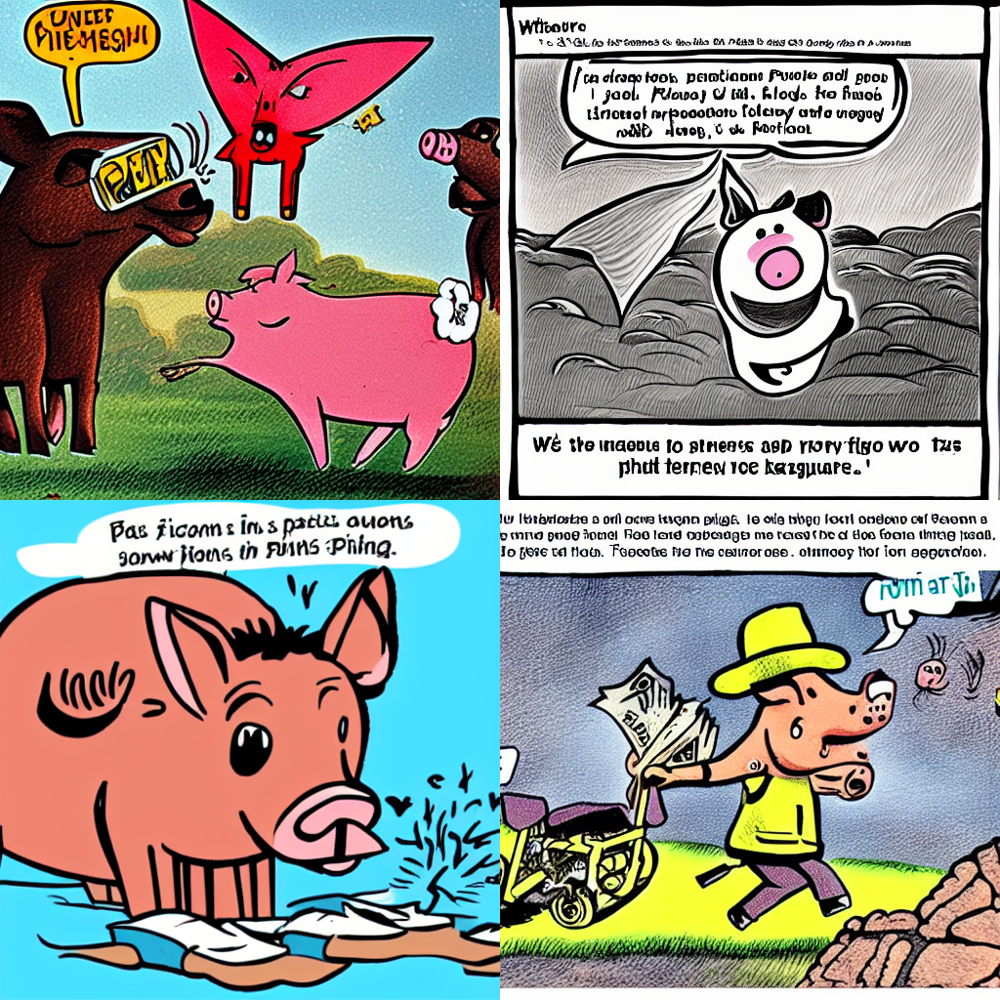

In [20]:
images = pipe(**get_inputs(batch_size=4)).images
image_grid(images)

By far most of the memory is taken up by the cross-attention layers. Instead of running this operation in batch, one can run it sequentially to save a significant amount of memory.


In [21]:
pipe.enable_attention_slicing()

  0%|          | 0/20 [00:00<?, ?it/s]

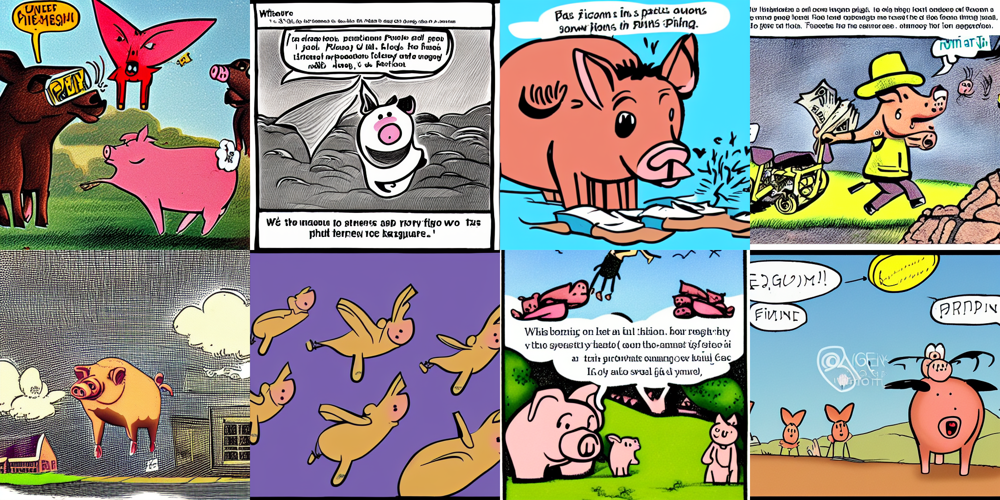

In [22]:
images = pipe(**get_inputs(batch_size=8)).images
image_grid(images, rows=2, cols=4)

## Trying different decoders

In [23]:
from diffusers import AutoencoderKL

vae = AutoencoderKL.from_pretrained("stabilityai/sd-vae-ft-mse")

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

In [24]:
pipe.vae = vae

  0%|          | 0/20 [00:00<?, ?it/s]

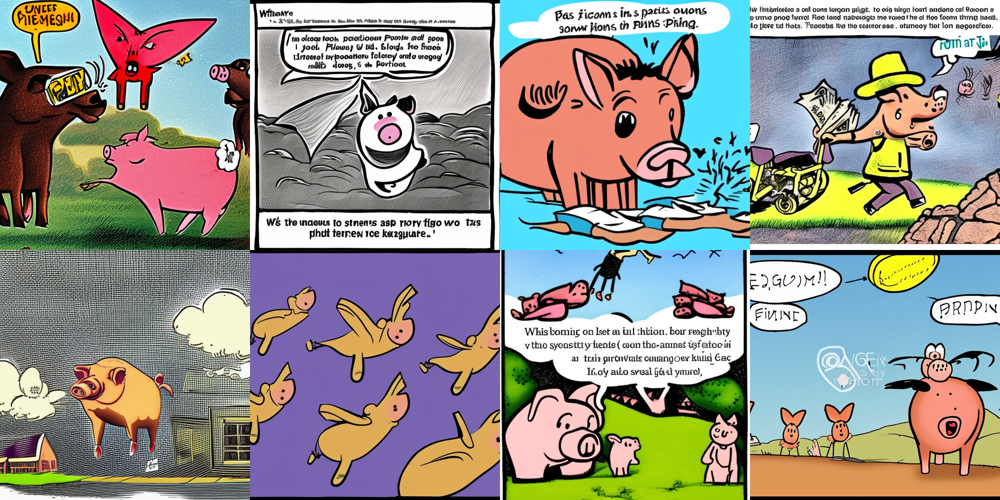

In [25]:
images = pipe(**get_inputs(batch_size=8)).images
image_grid(images, rows=2, cols=4)                                                                                                                                                                                                            

Seems the same. The default VAE worked faster, so let's use that one.